# **Waste Detection and Segmentation using Detectron2**

- Model Configuration
- Training, Testing & Evaluation
- Analysis & Visualization of Test data

## Mechanism of Object Detection in Detectron2

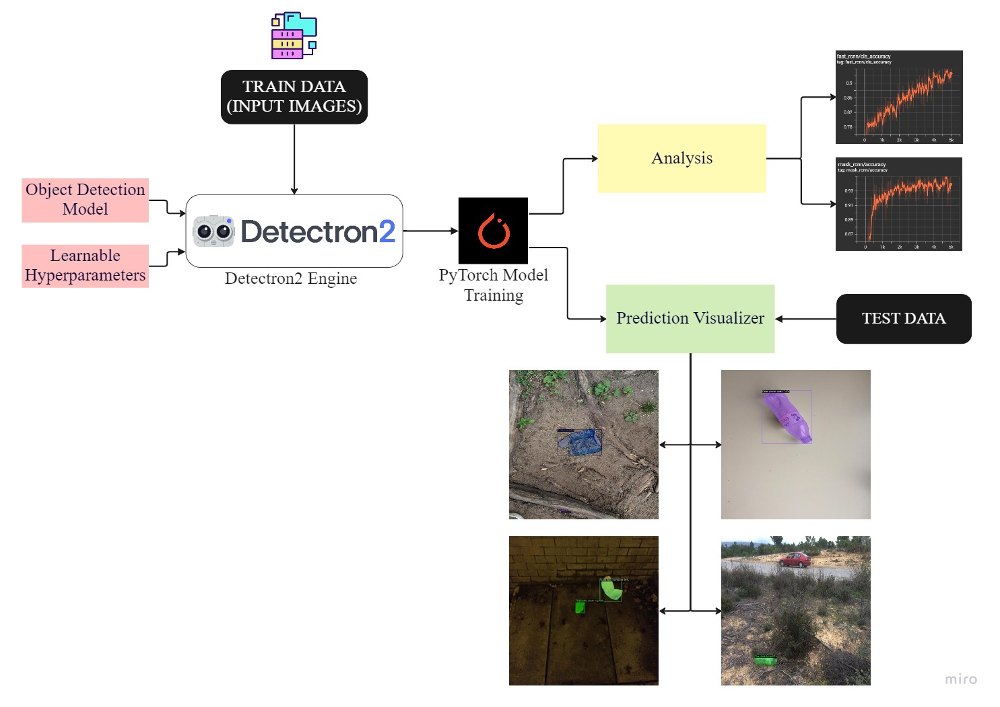

-----

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator` and set it to `GPU`.

In [ ]:
!python -V

Python 3.8.16


In [ ]:
  !nvidia-smi

Fri Dec 23 01:47:26 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0    26W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Install Detectron2 and dependencies

In [ ]:
# Clone from the Official Repo - Detectron2 Model 

%cd /content/drive/MyDrive/MiniProject/
# !git clone https://github.com/facebookresearch/detectron2.git
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

/content/drive/MyDrive/MiniProject
Cloning into 'detectron2'...
remote: Enumerating objects: 14678, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 14678 (delta 37), reused 61 (delta 26), pack-reused 14584
Receiving objects: 100% (14678/14678), 6.03 MiB | 5.68 MiB/s, done.
Resolving deltas: 100% (10587/10587), done.
Checking out files: 100% (819/819), done.


In [ ]:
# Install the Cloned the repo of Detectron2
%cd /content/drive/MyDrive/MiniProject/detectron2/
!pip install -e .

/content/drive/MyDrive/MiniProject/detectron2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/drive/MyDrive/MiniProject/detectron2
     |████████████████████████████████| 50 kB 6.2 MB/s 
     |████████████████████████████████| 79 kB 8.4 MB/s 
     |████████████████████████████████| 154 kB 77.5 MB/s 
     |████████████████████████████████| 1.5 MB 25.9 MB/s 
     |████████████████████████████████| 549 kB 69.9 MB/s 
     |████████████████████████████████| 117 kB 70.5 MB/s 
     |████████████████████████████████| 96 kB 6.3 MB/s 
     |████████████████████████████████| 182 kB 73.7 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61431 sha256=6cd8af5173a0b3b1e1e78e0315cbbb799f6c9cddc58a97a2ffc4f8b2eed113c5
  Stored in directory: /root/.cache/pip/wheels/b8/79/07/c0e9367f5b5ea325e246bd73651e8af175fabbef943043b1cc
  Created wheel for antlr4-python3-runtime: filename=antlr4_pyth

Now is a good time to confirm that we have the right versions of the libraries at our disposal.

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [ ]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.logger import setup_logger
setup_logger()

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

## COCO Format Dataset

Structure of your dataset should look like this:

```
dataset-directory/
├─ README.dataset.txt
├─ README.roboflow.txt
├─ train
│  ├─ train-image-1.jpg
│  ├─ train-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
├─ test
│  ├─ test-image-1.jpg
│  ├─ test-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
└─ valid
   ├─ valid-image-1.jpg
   ├─ valid-image-1.jpg
   ├─ ...
   └─ _annotations.coco.json
```

In [ ]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42 kB 869 kB/s 
     |████████████████████████████████| 67 kB 6.4 MB/s 
     |████████████████████████████████| 178 kB 56.7 MB/s 
     |████████████████████████████████| 138 kB 66.1 MB/s 
     |████████████████████████████████| 145 kB 70.3 MB/s 
     |████████████████████████████████| 54 kB 3.3 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=015a2a6edc9a73952e5929a6ba88ac6b7ade10564181e0bdd408c39fef09d014
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: certi

In [ ]:
%cd /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/

/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco


In [ ]:
# Download the dataset which was pre-processed in `Roboflow` platform in COCO-segmentation format

# from roboflow import Roboflow
# rf = Roboflow(api_key="")
# project = rf.workspace("waste-classification-i60om").project("waste-detection-t3cyp")
# dataset = project.version(1).download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Waste-Detection-1 in coco-segmentation:: 100%|██████████| 2291/2291 [00:16<00:00, 139.53it/s]


### Register

When you use Detectron2, before you actually train the model you need to [register it](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html#register-a-coco-format-dataset).

In [ ]:
DATA_SET_NAME = "Waste-Detection"
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [ ]:
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join("/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1", "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join("/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1", "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TRAIN_DATA_SET_NAME, 
    metadata={}, 
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH, 
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join("/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1", "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join("/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1", "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TEST_DATA_SET_NAME, 
    metadata={}, 
    json_file=TEST_DATA_SET_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join("/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1", "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join("/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1", "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=VALID_DATA_SET_NAME, 
    metadata={}, 
    json_file=VALID_DATA_SET_ANN_FILE_PATH, 
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

We can now confirm that our custom dataset was correctly registered using [MetadataCatalog](https://detectron2.readthedocs.io/en/latest/modules/data.html#detectron2.data.MetadataCatalog).

In [ ]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['Waste-Detection-train', 'Waste-Detection-test', 'Waste-Detection-valid']

### Visualize

Let's take a look at single entry from out train dataset.

[12/23 02:09:51 d2.data.datasets.coco]: Loading /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1/train/_annotations.coco.json takes 11.50 seconds.
WARNING [12/23 02:09:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/23 02:09:51 d2.data.datasets.coco]: Loaded 1833 images in COCO format from /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1/train/_annotations.coco.json


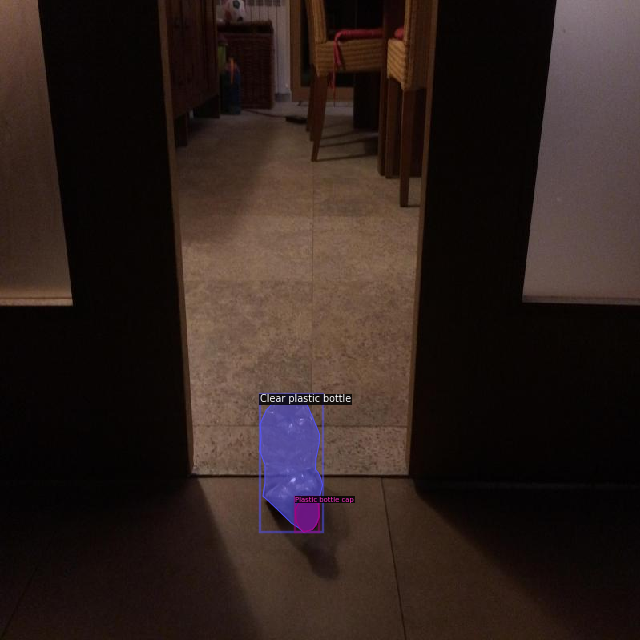

In [ ]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[1600]   # Enter any number ranges from 0-1832 to visualize the Train Dataset images with segmentation & Bounding Box
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

## Train Model Using Custom COCO Format Dataset 

### Configuration

In [ ]:
# HYPERPARAMETERS
ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 5000  # Maximum Number of iterations
EVAL_PERIOD = 500
BASE_LR = 0.001   # Learning Rate
NUM_CLASSES = 60  # Number of Classes

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME, 
    ARCHITECTURE, 
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
# cfg.MODEL.DEVICE = "cpu"

cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (VALID_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64

cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'

cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER

cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

### Training

In [ ]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/22 01:19:23 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:25, 9.99MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[12/22 01:19:53 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/22 01:20:19 d2.utils.events]:  eta: 1:12:00  iter: 19  total_loss: 5.676  loss_cls: 3.975  loss_box_reg: 0.8325  loss_mask: 0.6917  loss_rpn_cls: 0.0974  loss_rpn_loc: 0.01411  time: 0.8535  data_time: 0.4372  lr: 1.9981e-05  max_mem: 2583M
[12/22 01:20:37 d2.utils.events]:  eta: 1:11:57  iter: 39  total_loss: 5.248  loss_cls: 3.444  loss_box_reg: 0.8285  loss_mask: 0.6911  loss_rpn_cls: 0.07819  loss_rpn_loc: 0.02281  time: 0.8740  data_time: 0.4495  lr: 3.9961e-05  max_mem: 2584M
[12/22 01:20:56 d2.utils.events]:  eta: 1:12:00  iter: 59  total_loss: 3.942  loss_cls: 2.146  loss_box_reg: 0.7686  loss_mask: 0.6864  loss_rpn_cls: 0.07253  loss_rpn_loc: 0.01784  time: 0.8934  data_time: 0.5243  lr: 5.9941e-05  max_mem: 2584M
[12/22 01:21:13 d2.utils.events]:  eta: 1:10:12  iter: 79  total_loss: 2.876  loss_cls: 1.258  loss_box_reg: 0.8232  loss_mask: 0.6784  loss_rpn_cls: 0.04738  loss_rpn_loc: 0.01005  time: 0.8910  data_time: 0.4801  lr: 7.9921e-05  max_mem: 2584M
[12/22 01:21:31 d

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

### Evaluation

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7 # Set a custom threshold
predictor = DefaultPredictor(cfg)

## Inference and Evaluation

Now, let's run inference with the trained model on the TACO test dataset

[12/22 02:09:57 d2.data.datasets.coco]: Loading /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1/test/_annotations.coco.json takes 2.15 seconds.
WARNING [12/22 02:09:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/22 02:09:57 d2.data.datasets.coco]: Loaded 150 images in COCO format from /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1/test/_annotations.coco.json


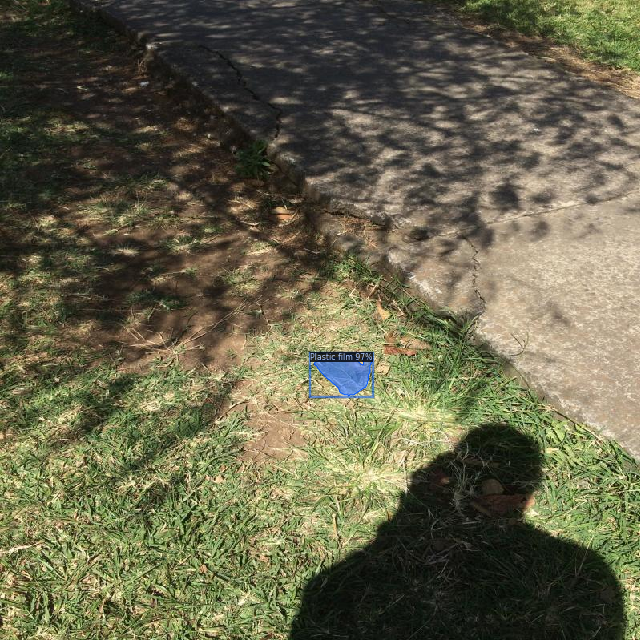

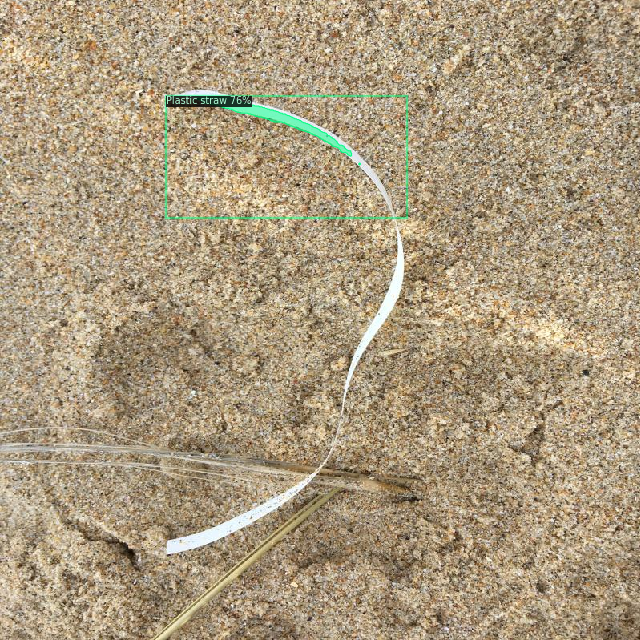

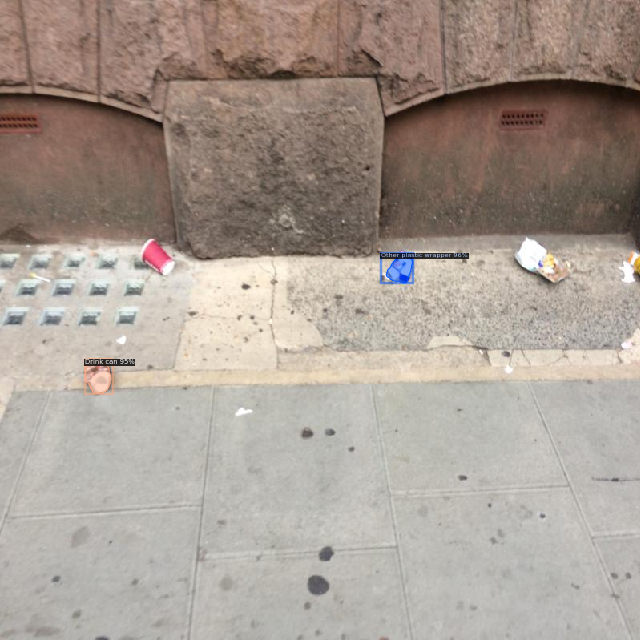

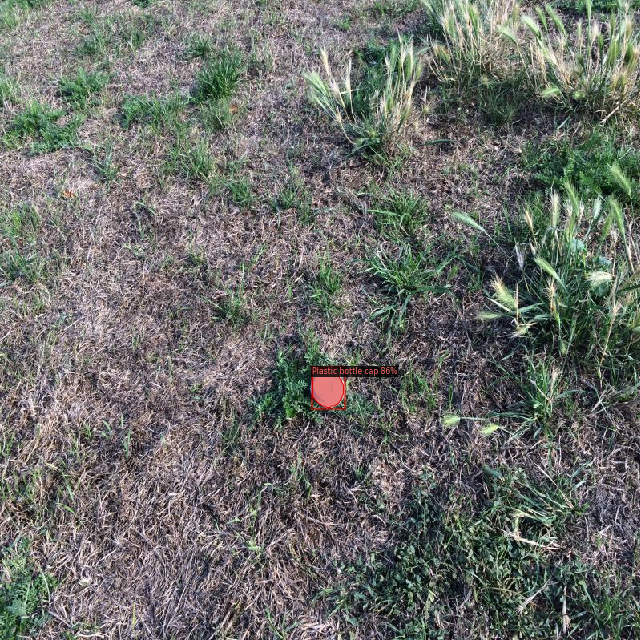

In [ ]:
dataset_test = DatasetCatalog.get(TEST_DATA_SET_NAME)

for d in dataset_test:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    
    visualizer = Visualizer(
        img[:, :, ::-1],
        metadata=metadata, 
        scale=0.8, 
        instance_mode=ColorMode.IMAGE
    )
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
# Save the Model parameters
torch.save(trainer.model.state_dict(), '/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection/mask_rcnn_R_101_FPN_3x/2022-12-20-04-03-57/model_0004999.pth')

In [ ]:
# Save the whole model
torch.save(trainer.model,"/content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection/mask_rcnn_R_101_FPN_3x/2022-12-20-04-03-57/model_0004999.pth")

Now, let's check the trained model with real time images

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/pexels-ron-lach-9034666.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/20221220_094718.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/20221220_094722.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/20221220_094739.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/20221220_094801.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

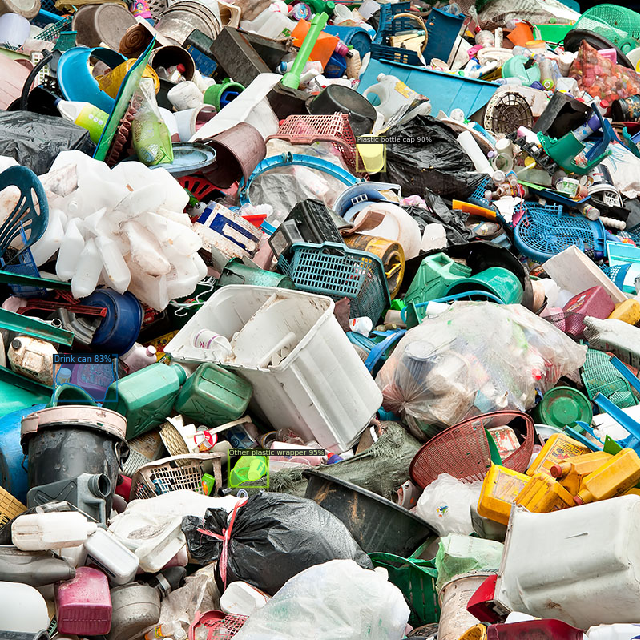

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/001.jpeg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

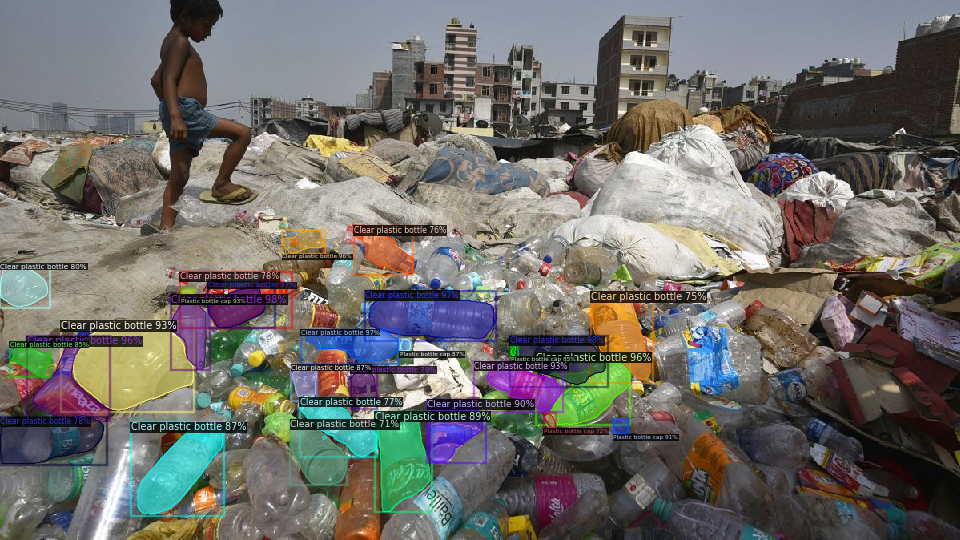

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/https___cdn.cnn.com_cnnnext_dam_assets_190607211423-12-india-plastic-waste-intl.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

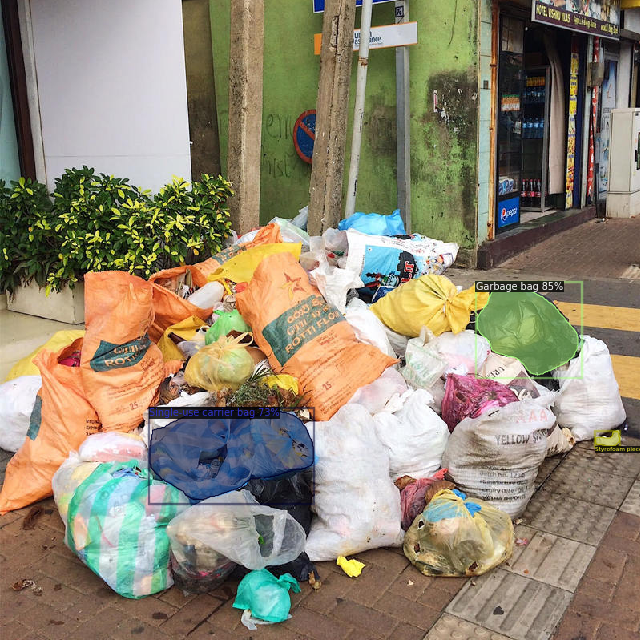

In [ ]:
im = cv2.imread("/content/drive/MyDrive/MiniProject/test_data/trash1_orig.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
              metadata=metadata, 
              scale=0.8
                )
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

## Evaluate the Model performance

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("Waste-Detection-valid", output_dir=OUTPUT_DIR_PATH)
val_loader = build_detection_test_loader(cfg, "Waste-Detection-valid")

print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [12/20 06:20:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/20 06:20:23 d2.data.datasets.coco]: Loaded 300 images in COCO format from /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1/valid/_annotations.coco.json
[12/20 06:20:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/20 06:20:23 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[12/20 06:20:23 d2.data.common]: Serializing 300 elements to byte tensors and concatenating them all ...
[12/20 06:20:23 d2.data.common]: Serialized dataset takes 0.55 MiB
[12/20 06:20:23 d2.evaluation.evaluator]: Start inference on 300 batches
[12/20 06:20:25 d2.evaluation.evaluator]: Inference done 11/300. Dataloading: 0.0022 s/iter. Inference: 0.1194 s/iter. Eval: 0.0040 s/iter

In [ ]:
trainer.test(cfg,predictor.model)

WARNING [12/20 06:17:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/20 06:17:42 d2.data.datasets.coco]: Loaded 300 images in COCO format from /content/drive/MyDrive/MiniProject/taco_dataset/taco_coco/Waste-Detection-1/valid/_annotations.coco.json
[12/20 06:17:42 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/20 06:17:42 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[12/20 06:17:42 d2.data.common]: Serializing 300 elements to byte tensors and concatenating them all ...
[12/20 06:17:42 d2.data.common]: Serialized dataset takes 0.55 MiB
WARNING [12/20 06:17:42 d2.engine.defaults]: No evaluator found. Use `DefaultTrainer.test(evaluators=)`, or implement its `build_evaluator` method.


{}